- Mapmycell annotaton for AP34a_MERFISH, donor-ID:1311

In [1]:
import anndata
import h5py
import json
import numpy as np
import pandas as pd
import pathlib
import scanpy as sc

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '3'

#### 1. Load the expression matrix

In [2]:
# load the raw data

fl_path = r'./processed_data/Gpe_Gpi_CaPu_1311__MERFISH_Ldclustered_adata.h5ad'
print(f'Running analysis for  {os.path.basename(fl_path)}')
adata = anndata.read_h5ad(fl_path)
adata

Running analysis for  Gpe_Gpi_CaPu_1311__MERFISH_Ldclustered_adata.h5ad


AnnData object with n_obs × n_vars = 1124161 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    layers: 'X_raw'
    obsp: 'connectivities', 'distances'

In [ ]:
# get the Ensemble ID for the MERFISH genes 
import pandas as pd
codebook = pd.read_csv(r'./../../processed_data/Final_codebook_BG_673gn.csv',index_col=0)
genes = [gn for gn in codebook.index if 'blank' not in gn.lower()]
gene2EnsembleID = codebook.loc[genes,'id'].to_dict()

adata.var['Ensemble_ID'] = '-1'
adata.var.loc[adata.var_names,'Ensemble_ID'] = codebook.loc[adata.var_names,'id']
adata.var

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,Ensemble_ID
ABCA8,184760,0.272883,0.241285,84.473141,324714,12.690703,ENSG00000141338
ABCG2,41428,0.065198,0.063160,96.518474,77581,11.259091,ENSG00000118777
ABI3BP,95439,0.219704,0.198608,91.979498,261434,12.473941,ENSG00000154175
ABO,91723,0.185102,0.169829,92.291783,220260,12.302568,ENSG00000175164
ACOXL,46532,0.057088,0.055518,96.089544,67931,11.126262,ENSG00000153093
...,...,...,...,...,...,...,...
YME1L1,80727,0.141254,0.132128,93.215865,168084,12.032225,ENSG00000136758
YPEL1,321788,2.192007,1.160650,72.957583,2608352,14.774230,ENSG00000100027
ZBTB7C,112572,0.270437,0.239361,90.539675,321803,12.681698,ENSG00000184828
ZEB2,994053,17.159699,2.899205,16.461782,20418978,16.831975,ENSG00000169554


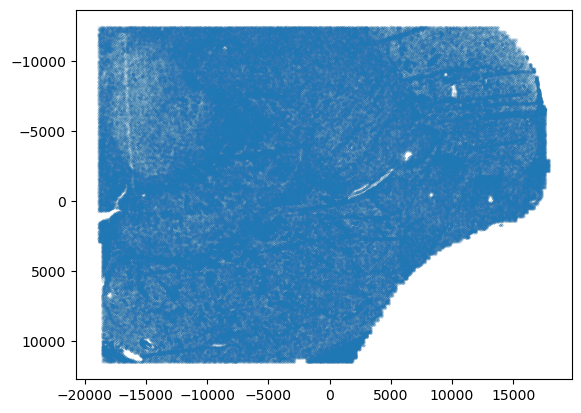

In [4]:
import matplotlib.pyplot as plt
plt.scatter(adata.obsm['X_spatial'][:,1],adata.obsm['X_spatial'][:,0], s = 0.001)
plt.gca().invert_yaxis()
plt.show()

- Save the input expression matrix for mapmycell

In [5]:
adata

AnnData object with n_obs × n_vars = 1124161 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'Ensemble_ID'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    layers: 'X_raw'
    obsp: 'connectivities', 'distances'

In [ ]:
# This is for single cell mapping 
# # save the expresssion matrix 
mapmycell_input = anndata.AnnData(adata.layers['X_raw'])
# remove the blank genes 
keep = [x != '-1' for x in adata.var['Ensemble_ID']]
mapmycell_input= mapmycell_input[:,keep]

mapmycell_input.var = adata[:,keep].var.set_index('Ensemble_ID')
mapmycell_input.obs_names = adata.obs_names




In [7]:
mapmycell_input

AnnData object with n_obs × n_vars = 1124161 × 673
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [10]:
del mapmycell_input.var['log1p_total_counts']
del mapmycell_input.var['total_counts']
del mapmycell_input.var['pct_dropout_by_counts']
del mapmycell_input.var['log1p_mean_counts']
del mapmycell_input.var['mean_counts']
del mapmycell_input.var['n_cells_by_counts']

In [11]:
mapmycell_input.var

""
Ensemble_ID
ENSG00000141338
ENSG00000118777
ENSG00000154175
ENSG00000175164
ENSG00000153093
...
ENSG00000136758
ENSG00000100027
ENSG00000184828


In [12]:
os.makedirs(r'./processed_data', exist_ok=True)
mapmycell_input.write_h5ad(r'./processed_data/mapmycell_input_' + f'{os.path.basename(fl_path)}',compression = 'gzip')

#### 2. Map the unlabeled_dataset to Allen snRNA-seq data

In [13]:
import sys
sys.path.append('/data/Bereket/cell_type_mapper/src')
from cell_type_mapper.cli.from_specified_markers import ( FromSpecifiedMarkersRunner)


In [ ]:
config = {
    'precomputed_stats': {
        'path': r'./../../HumanBG_scRNA_seq_Allen/Human.precomputed_stats.20250507.h5'
    },
    'query_markers': {
        'serialized_lookup': r'./../../HumanBG_scRNA_seq_Allen/Human.query_markers.20250507.json'
    },
    'type_assignment': {
        'bootstrap_factor': 0.5,
        'bootstrap_iteration': 100,
        'rng_seed': 661123,
        'n_processors': 1,
        'normalization': 'raw'
    },
    'query_path': r'./processed_data/mapmycell_input_' + f'{os.path.basename(fl_path)}',
    'extended_result_path': r'./processed_data/mapmycell_result_' + f'{os.path.basename(fl_path).split(".h5ad")[0]}.json',
    'csv_result_path': r'./processed_data/mapmycell_result_' + f'{os.path.basename(fl_path).split(".h5ad")[0]}.csv'
}

mapping_runner = FromSpecifiedMarkersRunner(
    args=[], input_data=config)

mapping_runner.run()

=== Running Hierarchical Mapping 1.5.1 with config ===
{
  "map_to_ensembl": false,
  "verbose_stdout": true,
  "nodes_to_drop": null,
  "type_assignment": {
    "n_processors": 1,
    "bootstrap_iteration": 100,
    "bootstrap_factor": 0.5,
    "bootstrap_factor_lookup": null,
    "chunk_size": 10000,
    "normalization": "raw",
    "rng_seed": 661123,
    "n_runners_up": 5,
    "min_markers": 10,
    "log_level": "ERROR"
  },
  "extended_result_path": "./processed_data/mapmycell_result_Gpe_Gpi_CaPu_1311__MERFISH_Ldclustered_adata.json",
  "hdf5_result_path": null,
  "csv_result_path": "./processed_data/mapmycell_result_Gpe_Gpi_CaPu_1311__MERFISH_Ldclustered_adata.csv",
  "summary_metadata_path": null,
  "obsm_key": null,
  "obsm_clobber": false,
  "verbose_csv": false,
  "query_path": "./processed_data/mapmycell_input_Gpe_Gpi_CaPu_1311__MERFISH_Ldclustered_adata.h5ad",
  "drop_level": null,
  "tmp_dir": null,
  "extended_result_dir": null,
  "flatten": false,
  "max_gb": 100.0,
  "cl

/data/Bereket/cell_type_mapper/src/cell_type_mapper/taxonomy/utils.py:253: UserWarning: This taxonomy has no mapping from leaf_node -> rows in the cell by gene matrix
  warnings.warn("This taxonomy has no mapping from leaf_node -> rows "
/data/Bereket/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: parent node 'CCN20250428_LEVEL_3/CS20250428_GROUP_0059' had too few markers in query set; augmenting with markers from ['CCN20250428_LEVEL_2/CS20250428_SUBCL_0015']
  warnings.warn(msg)
/data/Bereket/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: parent node 'CCN20250428_LEVEL_3/CS20250428_GROUP_0048' had too few markers in query set; augmenting with markers from ['CCN20250428_LEVEL_2/CS20250428_SUBCL_0001']
  warnings.warn(msg)
/data/Bereket/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: parent node 'CCN20250428_LEVEL_3/CS20250428_GROUP_0045' had too few markers in query set; augmenting with markers from ['CCN20250428_LEVEL

BENCHMARK: spent 5.9996e-02 seconds creating query marker cache
Running GPU implementation of type assignment.
Assignment: [  1/113]  Time [ 8.764 ( 8.764)  8.764]   Data [ 2.560 ( 2.560)  2.560] 
Assignment: [  2/113]  Time [ 5.697 ( 7.231) 14.462]   Data [ 0.001 ( 1.281)  2.562] 
Assignment: [  3/113]  Time [ 5.674 ( 6.712) 20.136]   Data [ 0.001 ( 0.854)  2.563] 
Assignment: [  4/113]  Time [ 5.787 ( 6.481) 25.923]   Data [ 0.001 ( 0.641)  2.564] 
Assignment: [  5/113]  Time [ 5.703 ( 6.325) 31.627]   Data [ 0.001 ( 0.513)  2.565] 
Assignment: [  6/113]  Time [ 5.648 ( 6.212) 37.275]   Data [ 0.001 ( 0.428)  2.566] 
Assignment: [  7/113]  Time [ 6.039 ( 6.188) 43.313]   Data [ 0.001 ( 0.367)  2.568] 
Assignment: [  8/113]  Time [ 5.862 ( 6.147) 49.176]   Data [ 0.001 ( 0.321)  2.569] 
Assignment: [  9/113]  Time [ 5.867 ( 6.116) 55.042]   Data [ 0.001 ( 0.286)  2.570] 
Assignment: [ 10/113]  Time [ 5.621 ( 6.066) 60.663]   Data [ 0.001 ( 0.257)  2.571] 
Assignment: [ 11/113]  Time [

[W705 14:26:11.031849838 CudaIPCTypes.cpp:16] Producer process has been terminated before all shared CUDA tensors released. See Note [Sharing CUDA tensors]


BENCHMARK: spent 6.9311e+02 seconds assigning cell types
Writing marker genes to output file
MAPPING FROM SPECIFIED MARKERS RAN SUCCESSFULLY
CLEANING UP


3. Check the mapping results

In [15]:
# check the mapping results.
import pandas as pd

cell_type_annotation = pd.read_csv(r'./processed_data/mapmycell_result_' + f'{os.path.basename(fl_path).split(".h5ad")[0]}.csv', header = 4)
cell_type_annotation['cell_id'] = cell_type_annotation['cell_id'].astype(str).astype('O')
cell_type_annotation = cell_type_annotation.set_index('cell_id')
cell_type_annotation

,Neighborhood_label,Neighborhood_name,Neighborhood_bootstrapping_probability,Class_label,Class_name,Class_bootstrapping_probability,Subclass_label,Subclass_name,Subclass_bootstrapping_probability,Group_label,Group_name,Group_bootstrapping_probability,Cluster_label,Cluster_name,Cluster_alias,Cluster_bootstrapping_probability
cell_id,,,,,,,,,,,,,,,,
Conv_zscan__4704--1,CS20250428_NEIGH_0002,Subpallium GABA,1.00,CS20250428_CLASS_0003,CN LGE GABA,1.00,CS20250428_SUBCL_0029,STR D2 MSN,1.00,CS20250428_GROUP_0052,STRd D2 Matrix MSN,0.57,CS20250428_CLUST_0468,Human-433,Human-433,0.33
Conv_zscan__4704--4,CS20250428_NEIGH_0001,Nonneuron,1.00,CS20250428_CLASS_0008,Immune,0.63,CS20250428_SUBCL_0019,Microglia,0.99,CS20250428_GROUP_0019,Microglia,1.00,CS20250428_CLUST_0218,Human-417,Human-417,0.28
Conv_zscan__4704--5,CS20250428_NEIGH_0001,Nonneuron,1.00,CS20250428_CLASS_0010,OPC-Oligo,0.97,CS20250428_SUBCL_0020,OPC,0.96,CS20250428_GROUP_0023,OPC,1.00,CS20250428_CLUST_0236,Human-191,Human-191,0.88
Conv_zscan__4704--6,CS20250428_NEIGH_0002,Subpallium GABA,1.00,CS20250428_CLASS_0003,CN LGE GABA,1.00,CS20250428_SUBCL_0029,STR D2 MSN,1.00,CS20250428_GROUP_0052,STRd D2 Matrix MSN,0.94,CS20250428_CLUST_0466,Human-381,Human-381,0.34
Conv_zscan__4704--7,CS20250428_NEIGH_0001,Nonneuron,1.00,CS20250428_CLASS_0010,OPC-Oligo,1.00,CS20250428_SUBCL_0022,Oligodendrocyte,0.96,CS20250428_GROUP_0025,Oligo OPALIN,0.67,CS20250428_CLUST_0227,Human-1,Human-1,0.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Conv_zscan__3919--198,CS20250428_NEIGH_0001,Nonneuron,0.88,CS20250428_CLASS_0010,OPC-Oligo,0.88,CS20250428_SUBCL_0022,Oligodendrocyte,0.59,CS20250428_GROUP_0025,Oligo OPALIN,0.41,CS20250428_CLUST_0228,Human-13,Human-13,0.34
Conv_zscan__3919--199,CS20250428_NEIGH_0001,Nonneuron,1.00,CS20250428_CLASS_0010,OPC-Oligo,1.00,CS20250428_SUBCL_0022,Oligodendrocyte,1.00,CS20250428_GROUP_0018,ImOligo,0.63,CS20250428_CLUST_0201,Human-47,Human-47,0.54
Conv_zscan__3919--200,CS20250428_NEIGH_0001,Nonneuron,0.99,CS20250428_CLASS_0000,Astro-Epen,0.97,CS20250428_SUBCL_0000,Astrocyte,1.00,CS20250428_GROUP_0039,Astrocyte,1.00,CS20250428_CLUST_0257,Human-485,Human-485,0.29


In [16]:
import anndata
mapmycell_input = anndata.read_h5ad(r'./processed_data/mapmycell_input_' + f'{os.path.basename(fl_path)}')

In [17]:
cell_type_annotation.index

Index(['Conv_zscan__4704--1', 'Conv_zscan__4704--4', 'Conv_zscan__4704--5',
       'Conv_zscan__4704--6', 'Conv_zscan__4704--7', 'Conv_zscan__4704--8',
       'Conv_zscan__4704--9', 'Conv_zscan__4704--10', 'Conv_zscan__4704--11',
       'Conv_zscan__4704--12',
       ...
       'Conv_zscan__3919--189', 'Conv_zscan__3919--191',
       'Conv_zscan__3919--193', 'Conv_zscan__3919--194',
       'Conv_zscan__3919--196', 'Conv_zscan__3919--198',
       'Conv_zscan__3919--199', 'Conv_zscan__3919--200',
       'Conv_zscan__3919--218', 'Conv_zscan__3919--220'],
      dtype='object', name='cell_id', length=1124161)

In [18]:
mapmycell_input.obs = mapmycell_input.obs.join(cell_type_annotation[['Class_label','Class_name','Class_bootstrapping_probability','Subclass_label','Subclass_name','Subclass_bootstrapping_probability','Group_label','Group_name','Group_bootstrapping_probability']])

In [19]:
cell_type_annotation[['Class_label','Class_name','Class_bootstrapping_probability','Subclass_label','Subclass_name','Subclass_bootstrapping_probability','Group_label','Group_name','Group_bootstrapping_probability']]

,Class_label,Class_name,Class_bootstrapping_probability,Subclass_label,Subclass_name,Subclass_bootstrapping_probability,Group_label,Group_name,Group_bootstrapping_probability
cell_id,,,,,,,,,
Conv_zscan__4704--1,CS20250428_CLASS_0003,CN LGE GABA,1.00,CS20250428_SUBCL_0029,STR D2 MSN,1.00,CS20250428_GROUP_0052,STRd D2 Matrix MSN,0.57
Conv_zscan__4704--4,CS20250428_CLASS_0008,Immune,0.63,CS20250428_SUBCL_0019,Microglia,0.99,CS20250428_GROUP_0019,Microglia,1.00
Conv_zscan__4704--5,CS20250428_CLASS_0010,OPC-Oligo,0.97,CS20250428_SUBCL_0020,OPC,0.96,CS20250428_GROUP_0023,OPC,1.00
Conv_zscan__4704--6,CS20250428_CLASS_0003,CN LGE GABA,1.00,CS20250428_SUBCL_0029,STR D2 MSN,1.00,CS20250428_GROUP_0052,STRd D2 Matrix MSN,0.94
Conv_zscan__4704--7,CS20250428_CLASS_0010,OPC-Oligo,1.00,CS20250428_SUBCL_0022,Oligodendrocyte,0.96,CS20250428_GROUP_0025,Oligo OPALIN,0.67
...,...,...,...,...,...,...,...,...,...
Conv_zscan__3919--198,CS20250428_CLASS_0010,OPC-Oligo,0.88,CS20250428_SUBCL_0022,Oligodendrocyte,0.59,CS20250428_GROUP_0025,Oligo OPALIN,0.41
Conv_zscan__3919--199,CS20250428_CLASS_0010,OPC-Oligo,1.00,CS20250428_SUBCL_0022,Oligodendrocyte,1.00,CS20250428_GROUP_0018,ImOligo,0.63
Conv_zscan__3919--200,CS20250428_CLASS_0000,Astro-Epen,0.97,CS20250428_SUBCL_0000,Astrocyte,1.00,CS20250428_GROUP_0039,Astrocyte,1.00


In [20]:
mapmycell_input.obsm['X_spatial'] = adata[mapmycell_input.obs_names].obsm['X_spatial']

In [21]:
import numpy as np
np.unique(mapmycell_input.obs['Class_name'] )

array(['Astro-Epen', 'CN CGE GABA', 'CN GABA-Glut', 'CN LGE GABA',
       'CN MGE GABA', 'Cx GABA', 'F M GABA', 'F M Glut', 'Immune',
       'M Dopa', 'OPC-Oligo', 'Vascular'], dtype=object)

In [22]:
mapmycell_input.obs['Class_name'].value_counts()

Class_name
OPC-Oligo       679074
Astro-Epen      146310
Vascular        109534
CN LGE GABA     106621
Immune           55393
CN MGE GABA       9874
F M GABA          7327
Cx GABA           6236
CN CGE GABA       2977
F M Glut           314
CN GABA-Glut       289
M Dopa             212
Name: count, dtype: int64

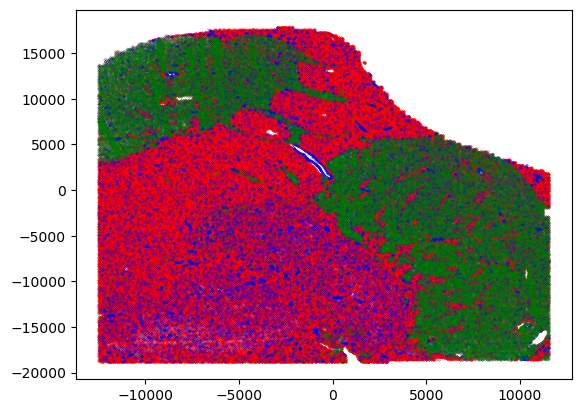

In [23]:
import matplotlib.pyplot as plt
keep_olig = mapmycell_input.obs['Class_name'] == 'OPC-Oligo'
keep_Vascular = mapmycell_input.obs['Class_name'] == 'Vascular'
keep_MSN = mapmycell_input.obs['Class_name'] ==  'CN LGE GABA'

plt.scatter(mapmycell_input[keep_olig].obsm['X_spatial'][:,0],mapmycell_input[keep_olig].obsm['X_spatial'][:,1], s = 0.01, c = 'r')
plt.scatter(mapmycell_input[keep_Vascular].obsm['X_spatial'][:,0],mapmycell_input[keep_Vascular].obsm['X_spatial'][:,1], s = 0.01, c = 'b')
plt.scatter(mapmycell_input[keep_MSN].obsm['X_spatial'][:,0],mapmycell_input[keep_MSN].obsm['X_spatial'][:,1], s = 0.01, c = 'g')
plt.show()

-  Check the spatial map of the labeled cells

In [24]:
def plot_cluster_scdata(scdata,cmap,all_clusters,clusters=[1,2],bg_color = 'gray',bg_pt_size = 5, point_sz = 25, transpose=1,flipx=1,flipy=1,hue_input = 'leiden' , ax = None,use_seaborn = False,show_title = True):
    """
    plot spatial location of cell cluster using either seaborn or matplotlib
    use seaborn for individual clusters
    use matplotlib scatter function to visualize all clusters
    cmap - dictionary that has color of each cluster  used in umap
    """
    fig = None
    if not ax:
     fig,ax = plt.subplots(figsize=(15, 15),)# facecolor="black")

    
    if use_seaborn:
        x,y,hue = 'x', 'y',hue_input
        sns.scatterplot(x=x, y=y, data=scdata.obs, 
                        s=bg_pt_size, markers=dict(marker_edge_color='none'),
                        rasterized=True,
                        ax=ax,c= bg_color)
    else: # use matplotlib
        x,y = (np.array(scdata.obs[['x', 'y']])*[flipx,flipy])[:,::transpose].T
        ax.scatter(x, y, c=bg_color, s = bg_pt_size, marker='.')
        
    for cluster in clusters:
        clst_idx = all_clusters.index(cluster)
        cluster_ = str(cluster)
        inds = scdata.obs[hue_input] == cluster_
        
        #col = cmap[int(clst_idx) % len(cmap)]
        col = cmap[cluster_] # cmap is dictionary
        
        if use_seaborn:
            sns.scatterplot(x=x, y=y, data=scdata.obs[inds], 
                        s=point_sz, markers=dict(marker_edge_color='none'),
                        rasterized=True,
                        ax=ax,c= col)
            if show_title:
                ax.set_title(f'cluster {cluster_}',fontsize = 7, y= 1)
        else:
            x_ = x[inds]
            y_ = y[inds]
            ax.scatter(x_, y_, c=col, s= point_sz, marker='.',label = cluster_)
        
        
    
    # ax.set_xlim([x.min(),x.max()])
    # ax.set_ylim([y.min(),y.max()])
    ax.grid(False)
    ax.axis("off")
    ax.axis("equal")
    if fig:
        ax.legend( loc = 'lower center', ncol = len(clusters)//3,markerscale = 12, title = 'Clusters',facecolor = 'black',
            labelcolor = 'white')
        ax.set_title(np.unique(scdata.obs['sample'])[0])
    else:
        # ax.legend( loc = 'lower center')
        pass
        
    ax.autoscale(enable=True, tight=True)
    
   

In [25]:
#### rotate the sections by some degree manually
def rotate(spatial_x,deg):
    """
    spatial_X: Nx2 matrix
    deg: rotation degree in radian
    
    """
    deg = np.deg2rad(deg)
    rotation_mat = np.array([[np.cos(deg),-1*np.sin(deg)],
                            [np.sin(deg),np.cos(deg)]])
    return np.matmul(spatial_x,rotation_mat)

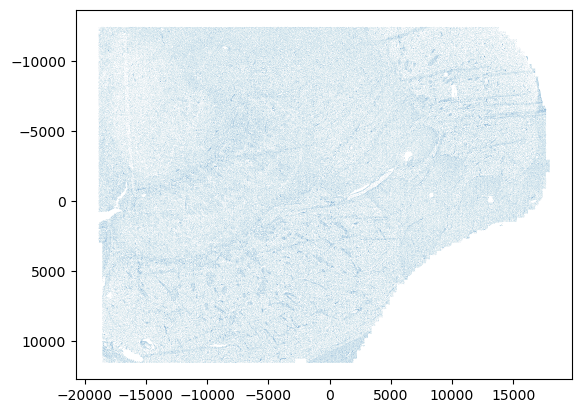

In [26]:
import seaborn as sns
fig,ax  = plt.subplots(1,1,dpi = 100)

sns.scatterplot(x =mapmycell_input.obsm['X_spatial'][:,1],y= mapmycell_input.obsm['X_spatial'][:,0],s  = 0.01,ax = ax)
ax.invert_yaxis()
plt.show()

In [27]:
deg = -90
spatial_rot = rotate(mapmycell_input.obsm['X_spatial'].toarray(),deg)


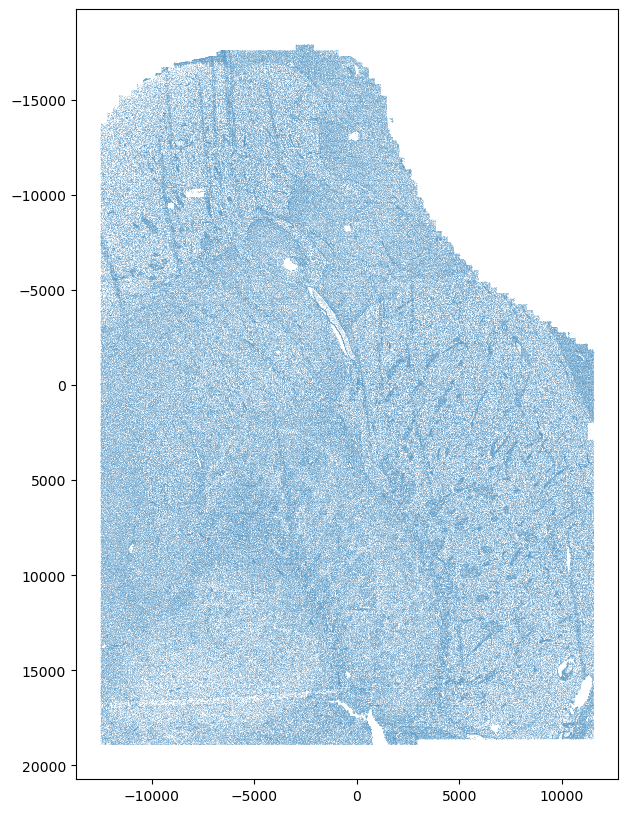

In [28]:
import seaborn as sns
fig,ax  = plt.subplots(1,1,dpi = 100,figsize = (7,10))

sns.scatterplot(x =spatial_rot[:,1],y= spatial_rot[:,0],s  = 0.1,ax = ax)
ax.invert_yaxis()
plt.show()

In [29]:
# update Y and X with the rotated coordinates
mapmycell_input.obs[['y','x']] = spatial_rot.copy()
mapmycell_input.obs

,Class_label,Class_name,Class_bootstrapping_probability,Subclass_label,Subclass_name,Subclass_bootstrapping_probability,Group_label,Group_name,Group_bootstrapping_probability,y,x
Conv_zscan__4704--1,CS20250428_CLASS_0003,CN LGE GABA,1.00,CS20250428_SUBCL_0029,STR D2 MSN,1.00,CS20250428_GROUP_0052,STRd D2 Matrix MSN,0.57,-8619.377457,-11604.467504
Conv_zscan__4704--4,CS20250428_CLASS_0008,Immune,0.63,CS20250428_SUBCL_0019,Microglia,0.99,CS20250428_GROUP_0019,Microglia,1.00,-8460.366310,-11600.180346
Conv_zscan__4704--5,CS20250428_CLASS_0010,OPC-Oligo,0.97,CS20250428_SUBCL_0020,OPC,0.96,CS20250428_GROUP_0023,OPC,1.00,-8554.171776,-11594.035107
Conv_zscan__4704--6,CS20250428_CLASS_0003,CN LGE GABA,1.00,CS20250428_SUBCL_0029,STR D2 MSN,1.00,CS20250428_GROUP_0052,STRd D2 Matrix MSN,0.94,-8693.824646,-11590.767012
Conv_zscan__4704--7,CS20250428_CLASS_0010,OPC-Oligo,1.00,CS20250428_SUBCL_0022,Oligodendrocyte,0.96,CS20250428_GROUP_0025,Oligo OPALIN,0.67,-8467.169830,-11586.586590
...,...,...,...,...,...,...,...,...,...,...,...
Conv_zscan__3919--198,CS20250428_CLASS_0010,OPC-Oligo,0.88,CS20250428_SUBCL_0022,Oligodendrocyte,0.59,CS20250428_GROUP_0025,Oligo OPALIN,0.41,-4843.719696,-7999.294792
Conv_zscan__3919--199,CS20250428_CLASS_0010,OPC-Oligo,1.00,CS20250428_SUBCL_0022,Oligodendrocyte,1.00,CS20250428_GROUP_0018,ImOligo,0.63,-4663.223656,-7956.438591
Conv_zscan__3919--200,CS20250428_CLASS_0000,Astro-Epen,0.97,CS20250428_SUBCL_0000,Astrocyte,1.00,CS20250428_GROUP_0039,Astrocyte,1.00,-4782.246094,-7893.105438
Conv_zscan__3919--218,CS20250428_CLASS_0010,OPC-Oligo,0.97,CS20250428_SUBCL_0022,Oligodendrocyte,0.99,CS20250428_GROUP_0026,Oligo PLEKHG1,0.84,-4604.366489,-7844.221115


In [30]:
cmap = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45",
        "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1",
        "#000075", "#a9a9a9"]

In [31]:
keep =  mapmycell_input.obs['Class_name'] == 'CN LGE GABA'
np.unique(mapmycell_input[keep].obs['Group_name'])

array(['GPe MEIS2-SOX6 GABA', 'OT D1 ICj', 'STR D1D2 Hybrid MSN',
       'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN',
       'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN',
       'STRd D2 Striosome MSN', 'STRv D1 MSN', 'STRv D1 NUDAP MSN',
       'STRv D2 MSN'], dtype=object)

In [32]:
adata

AnnData object with n_obs × n_vars = 1124161 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'Ensemble_ID'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    layers: 'X_raw'
    obsp: 'connectivities', 'distances'

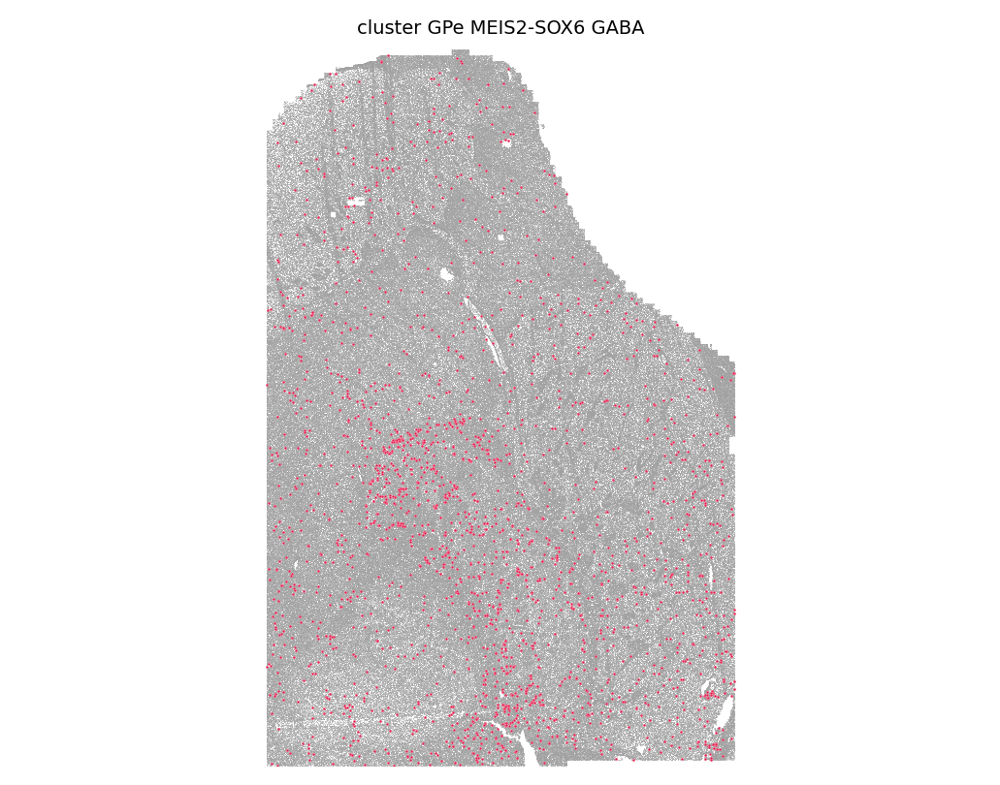

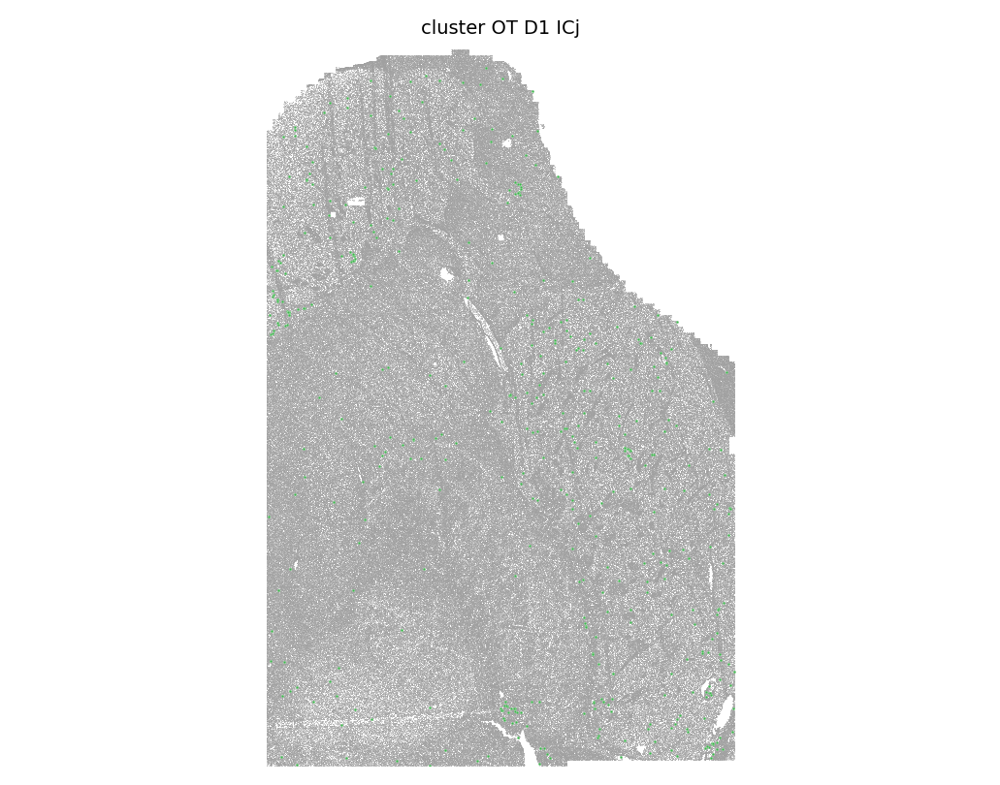

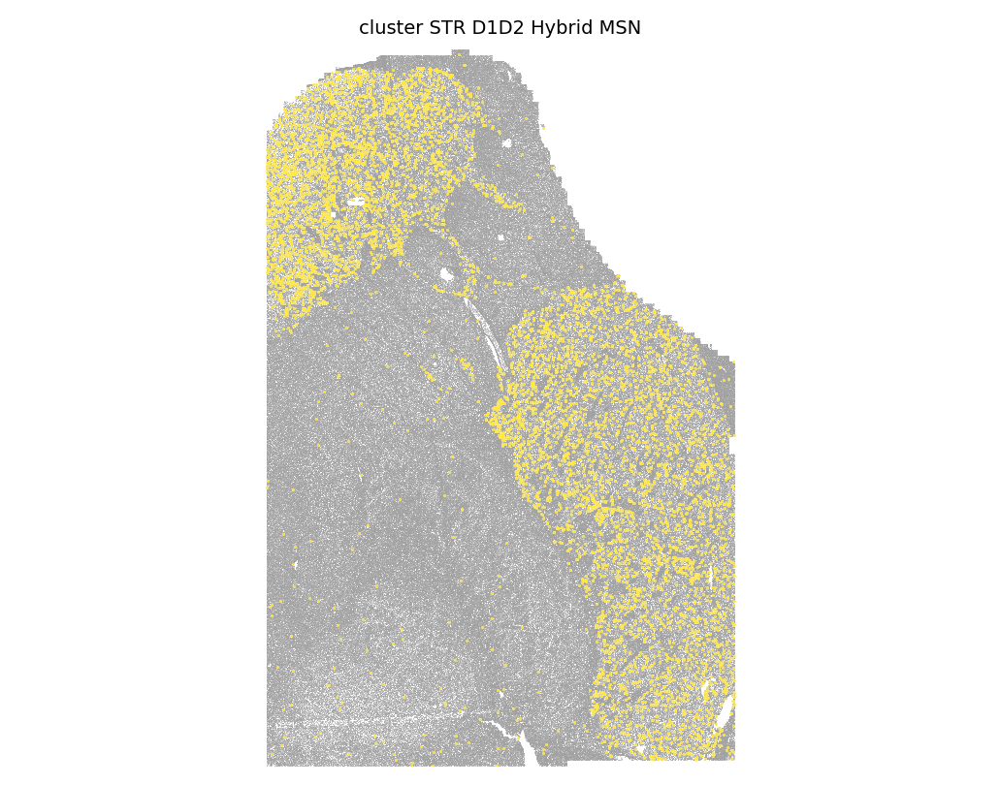

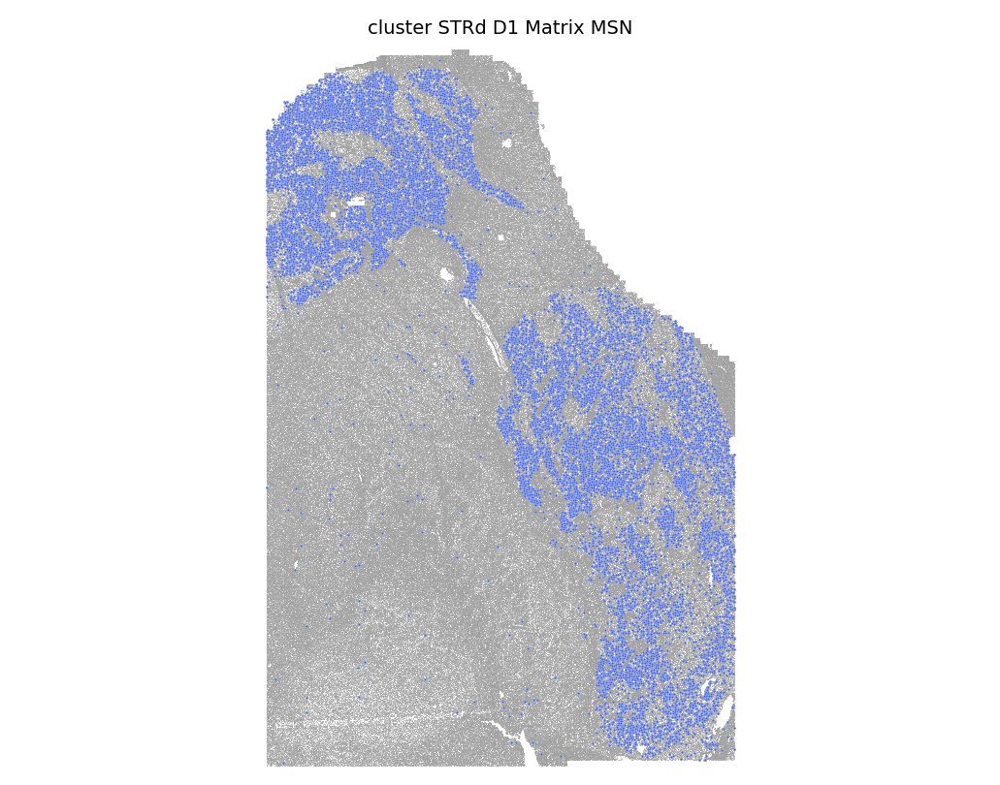

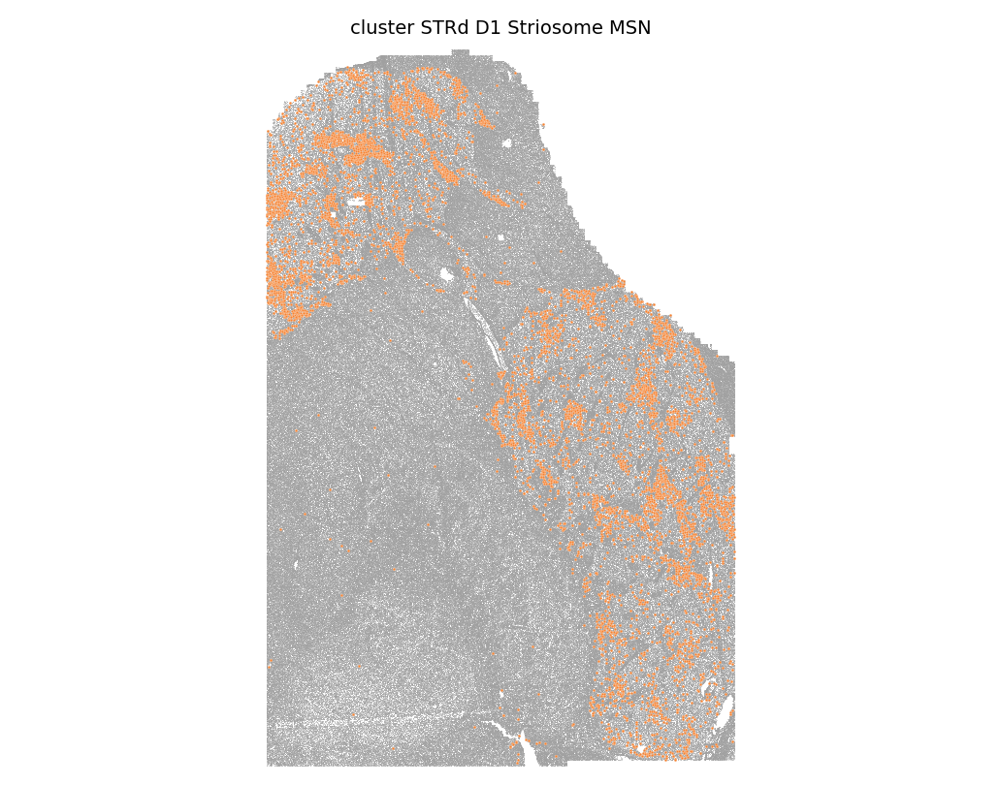

...

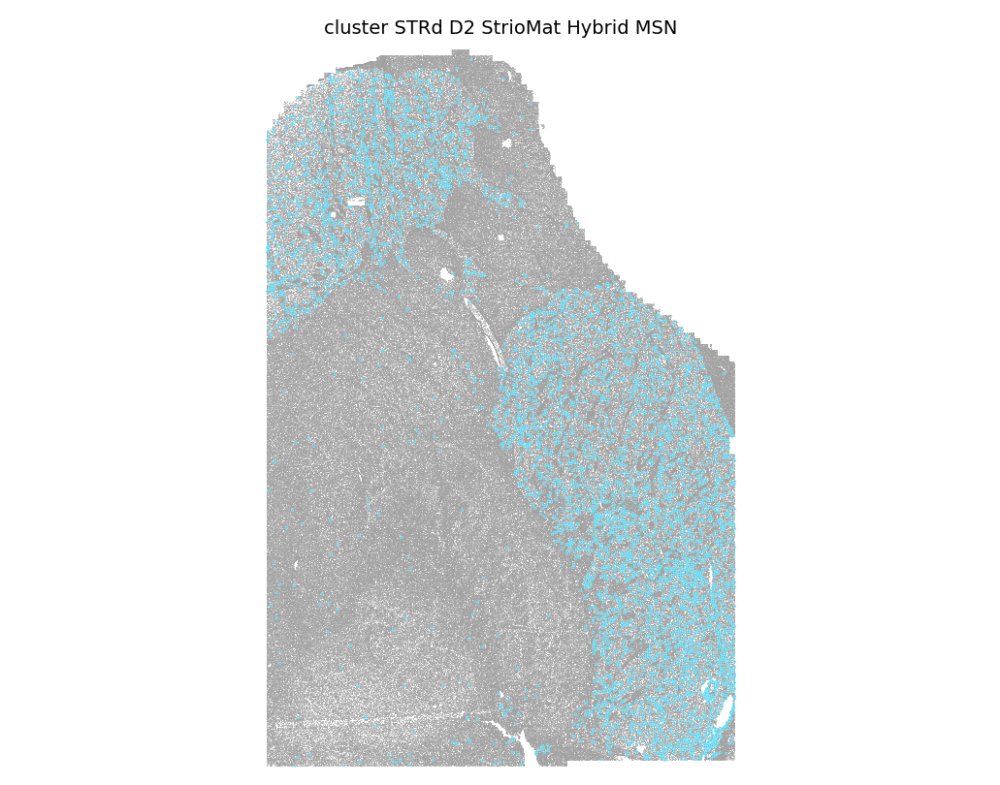

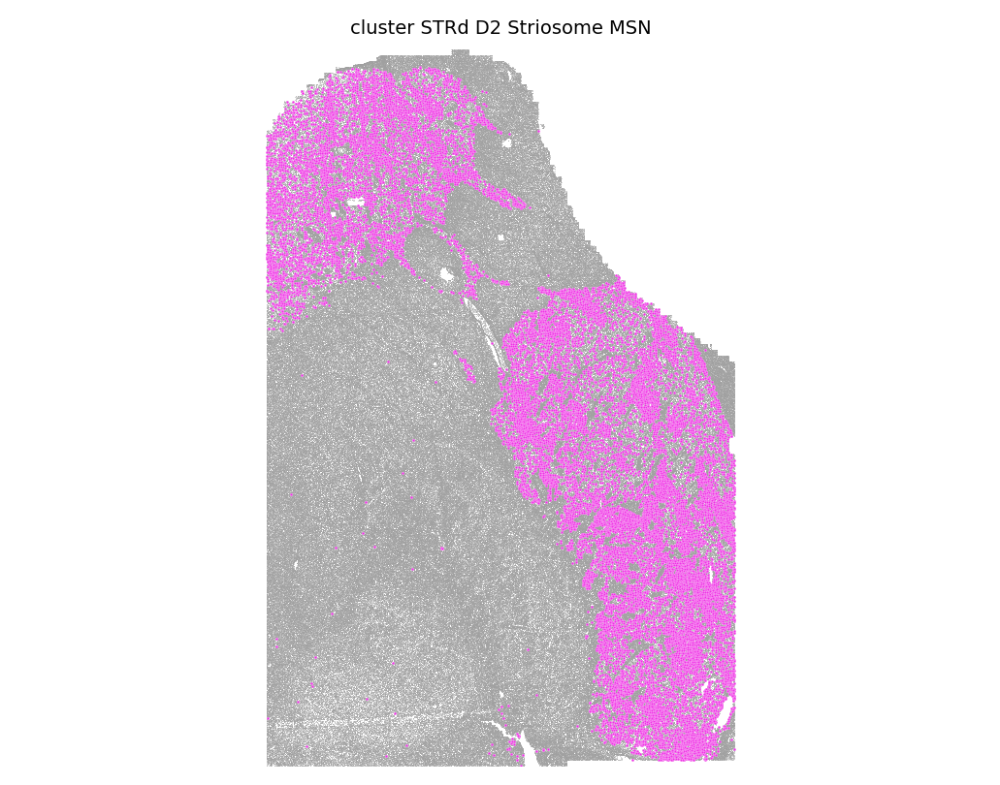

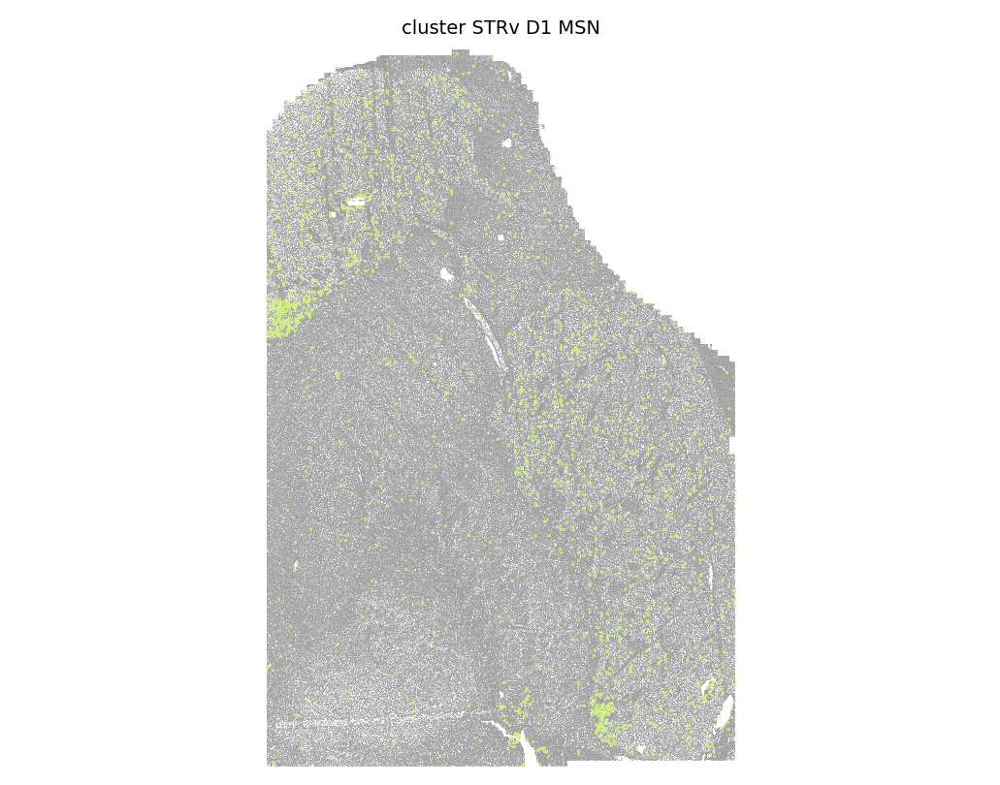

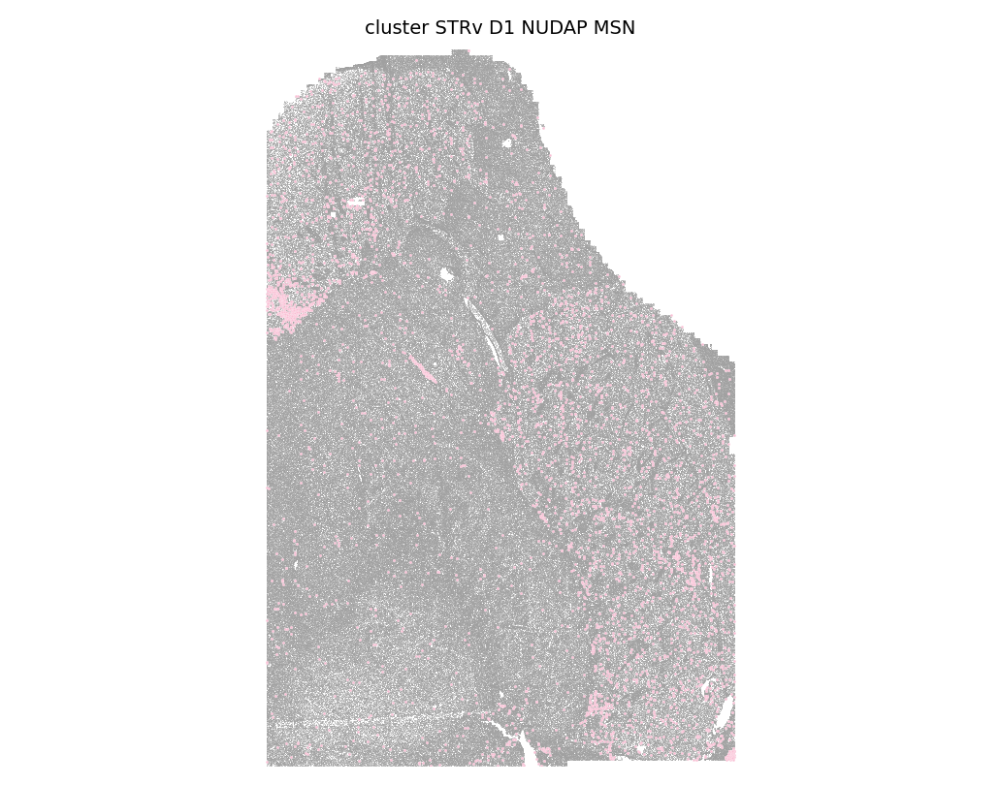

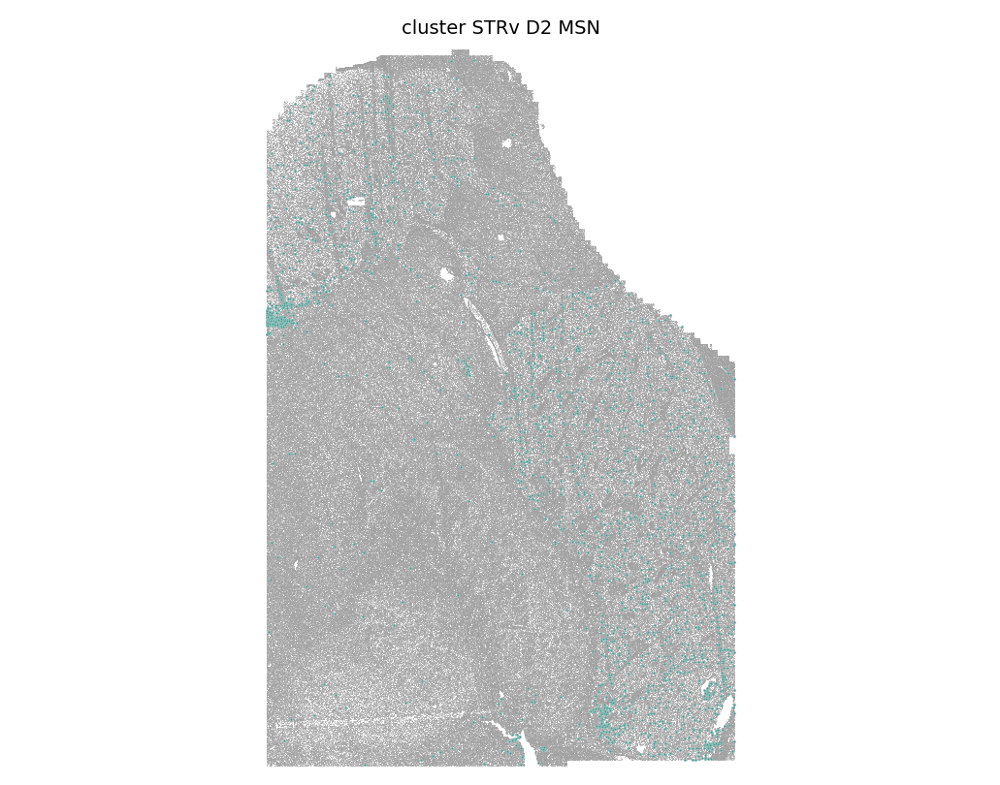

In [33]:
import seaborn as sns
# clusters = list(np.unique(mapmycell_input.obs['Class_name']))
clusters = ['GPe MEIS2-SOX6 GABA', 'OT D1 ICj', 'STR D1D2 Hybrid MSN',
       'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN',
       'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN',
       'STRd D2 Striosome MSN', 'STRv D1 MSN', 'STRv D1 NUDAP MSN',
       'STRv D2 MSN']
cluster_cmap = {c:cmap[i%len(cmap)] for i,c in enumerate(clusters)}


for clst in clusters: #np.unique(mapmycell_input.obs['Class_name']):
    fig,ax = plt.subplots(1,1, dpi = 200)
    plot_cluster_scdata(mapmycell_input,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.06,point_sz = 1,ax = ax,use_seaborn = True,hue_input = 'Group_name')
    ax.invert_yaxis()
    plt.show()

# fig = plt.figure(dpi = 500)
# nrows = 4
# gs = fig.add_gridspec(nrows = nrows +2,ncols = len(clusters)//nrows,)
# for i,clst in enumerate(clusters):
#     ax = fig.add_subplot(gs[i//gs.ncols,i%gs.ncols])
#     plot_cluster_scdata(mapmycell_input,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.06,point_sz = 0.1,ax = ax,use_seaborn = True,hue_input = 'Class_name')
# # plt.savefig(DATA_DIR + os.sep + 'figures' + os.sep + sample +'_individual_cluster_insitu.tif' ) 
# plt.show()

### 4. check alignment with UMAP

In [34]:
adata.obs = adata.obs.join(cell_type_annotation)

In [35]:
adata.obs.columns

Index(['volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'leiden', 'Neighborhood_label',
       'Neighborhood_name', 'Neighborhood_bootstrapping_probability',
       'Class_label', 'Class_name', 'Class_bootstrapping_probability',
       'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability',
       'Group_label', 'Group_name', 'Group_bootstrapping_probability',
       'Cluster_label', 'Cluster_name', 'Cluster_alias',
       'Cluster_bootstrapping_probability'],
      dtype='object')

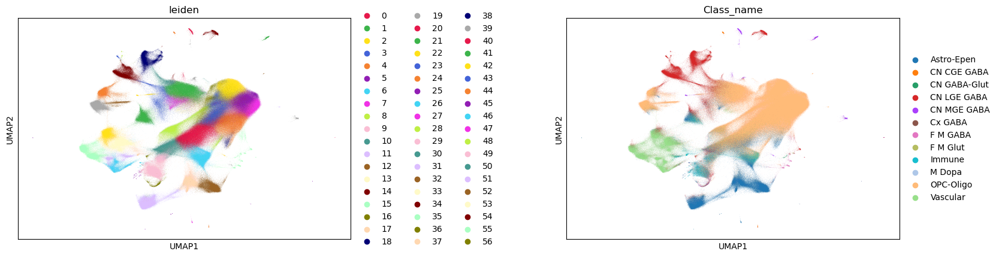

In [36]:
sc.pl.umap(adata, color = ['leiden','Class_name'],wspace = 0.5)

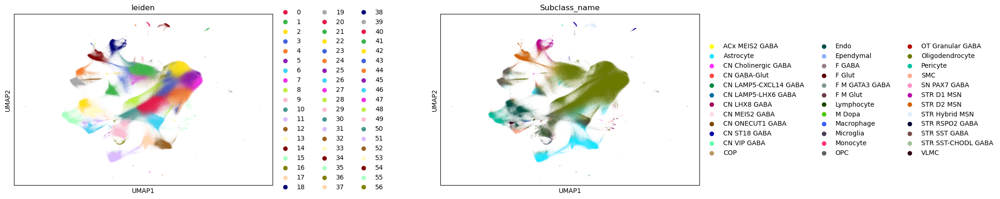

In [37]:
sc.pl.umap(adata, color = ['leiden','Subclass_name'],wspace = 0.5)

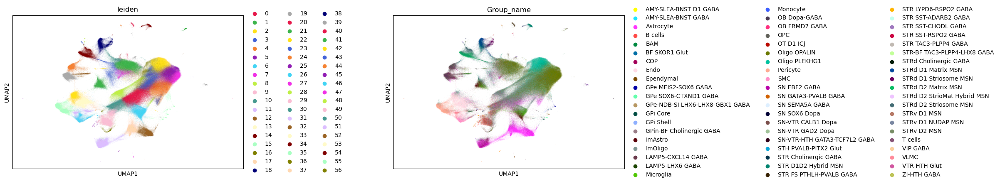

In [38]:
sc.pl.umap(adata, color = ['leiden','Group_name'],wspace = 0.5)

In [39]:
# save the rotated spatial coordinate 
adata.obsm['X_spatial_rotated'] = mapmycell_input.obs[['x','y']].values.copy()

In [40]:
fl_path.replace('.h5ad','_annotated.h5ad')

'./processed_data/Gpe_Gpi_CaPu_1311__MERFISH_Ldclustered_adata_annotated.h5ad'

In [41]:
adata.write_h5ad(fl_path.replace('.h5ad','_mapmycellAnnotated.h5ad'), compression='gzip')

In [42]:
adata

AnnData object with n_obs × n_vars = 1124161 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'Ensemble_ID'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap', 'Class_name_colors', 'Subclass_name_colors', 'Group_name_colors'
    obsm: 'X_raw', 'X_spatial', 'X_umap', 'X_s

In [44]:
adata.layers['X_raw'].shape,adata.obsm['X_raw'].shape

((1124161, 673), (1124161, 769))